# Исследования рынка общепита в Москве для принятия решения об открытии нового заведения

## Описание проекта

*Цели и задачи проекта*

Исследование рынка общественного питания на основе открытых данных, подготовка презентации для инвесторов.

*Данные*

Нам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года.

Файл moscow_places.csv:
- name — название заведения;
- address — адрес заведения;
- category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- hours — информация о днях и часах работы;
- lat — широта географической точки, в которой находится заведение;
- lng — долгота географической точки, в которой находится заведение;
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- price — категория цен в заведении;
- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона
- middle_avg_bill — число с оценкой среднего чека;
- middle_coffee_cup — число с оценкой одной чашки капучино;
- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым;
- district — административный район, в котором находится заведение;
- seats — количество посадочных мест.

*План*

1. [Общая информация](#info)
2. [Предобработка данных](#preprocessing)
3. [Анализ данных](#analysis)
    * [Распределение заведений по категориям](#analysis_category)
    * [Распределение посадочных мест по категориям](#analysis_seats)
    * [Соотношение сетевых и несетевых заведений](#analysis_chain)
    * [Распределение заведений по районам](#analysis_district)
    * [Распределение средних рейтингов по категориям](#analysis_rating)
    * [Распределение заведений по улицам](#analysis_street)
    * [Средний чек заведений по районам](#analysis_bill)
    * [Заведения с низкими рейтингами](#analysis_low_rating)
    * [Вывод](#analysis_conclusion)
4. [Детальное исследование: открытие кофейни](#research)
5. [Общий вывод, рекомендации](#conclusion)

## Общая информация

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objs as go
import plotly.offline as pyo
from pylab import rcParams
rcParams['figure.figsize'] = 12, 5
import warnings
pd.options.display.max_colwidth = 400
from folium import Marker, Map, Choropleth
from folium.plugins import MarkerCluster

In [2]:
try:
    data = pd.read_csv('/datasets/moscow_places.csv')
except:
    data = pd.read_csv('/Users/porphyrion/Desktop/PRACTICUM/my_projects/datasets/moscow_places.csv')

In [3]:
data.head(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00–22:00",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [5]:
data['name'].nunique()

5614

In [6]:
data.describe()

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8406.000000,8406.000000,8406.000000,3149.000000,535.000000,8406.000000,4795.000000
mean,55.750109,37.608570,4.229895,958.053668,174.721495,0.381275,108.421689
std,0.069658,0.098597,0.470348,1009.732845,88.951103,0.485729,122.833396
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000,0.000000
25%,55.705155,37.538583,4.100000,375.000000,124.500000,0.000000,40.000000
50%,55.753425,37.605246,4.300000,750.000000,169.000000,0.000000,75.000000
75%,55.795041,37.664792,4.400000,1250.000000,225.000000,1.000000,140.000000
max,55.928943,37.874466,5.000000,35000.000000,1568.000000,1.000000,1288.000000


**Наблюдение:** в датасете представлены 5614 уникальных названий заведений, всего заведений 8406.\
В целом форматы данных во всех столбцах совпадают с содержимым и не требуют изменений.\
Наблюдаются выбросы в столбцах middle_avg_bill и middle_coffee_cup.

## Предобработка данных
<a id="preprocessing"></a> 

Проверим данные на неявные дубликаты.

In [7]:
data['name'] = data['name'].replace({
    'Festa&Тесто':'Festa & Тесто', 
     "It's СоТ-Кофейня":"It's СоТ - Кофейня", 
     "Jeffrey’s Coffeeshop":"Jeffrey's Coffeeshop",
     'Гастрорюмочная Шесть-You-Шесть':'Гастрорюмочная Шесть You Шесть',
     'Глобус, ресторан':'Глобус ресторан',
     'VIP Wok & sushi':'VIP Wok and sushi',
     'Доминос пицца':"Домино'с пицца",
     'Есть Хинкали&Пить Вино':'Есть Хинкали & Пить Вино',
     'Ив. Дурдинъ':'Иван Дурдинъ',
     'Правда Кофе Остоженка 42/2':'Правда Кофе',
     'ФО БО & Том Ям':'ФО БО и Том Ям',
     'Яндекс.Лавка':'Яндекс Лавка'
    })

В названиях заведений содержится много дубликатов типа 'Han Cook' - 'Han cook'. Избавимся от таких дубликатов, приведя названия к нижнему регистру.

In [8]:
data['name'] = data['name'].str.lower()

Избавимся от часто встречающихся неявных дубликатов в адресах заведений, а также удалим название административного округа из адреса.

In [9]:
data['address'] = data['address'].replace(
     {
    ', стр. ' : 'с', 
     ', корп. ':'к', 
     'владение ':'вл',
     ' Восточный административный округ, ':' ',
     ' Западный административный округ, ':' ',
     ' Северный административный округ, ':" ",
     ' Северо-Восточный административный округ, ':' ',
     ' Центральный административный округ, ':' ',
     ' Юго-Восточный административный округ, ':' ',
     ' Южный административный округ, ':' ',
     'Капотня':'Капотни'
    },
regex=True)

In [10]:
data.duplicated().sum() #проверка на полные дубликаты

0

In [11]:
data['name'].nunique()

5500

In [12]:
data.isna().sum() #пропуски

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

In [13]:
#добавим столбец с названием улицы
data['street'] = data['address'].str.split(r',\s*').str[1]

In [14]:
#добавим столбец с обозначением, что заведение работает 24/7
data['is_24/7'] = data['hours'] == 'ежедневно, круглосуточно'

In [15]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36к1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False


**Вывод:** в колонках hours, price, avg_bill, middle_avg_bill, middle_coffee_cup имеются пропуски, для их заполнения недостаточно информации. Добавлены столбцы с названием улицы и с признаком круглосуточной работы. После удаления дубликатов осталось 5500 уникальных названий заведений.

## Анализ данных
<a id="analysis"></a> 

### Распределение заведений по категориям
<a id="analysis_category"></a> 

Исследуем количество объектов общественного питания по категориям и построим визуализацию.

In [16]:
data_cat = (
    data.groupby('category', as_index=False)['name'].count()
    .sort_values(by='name', ascending=False)
    .rename(columns={'name':'count'})
)
data_cat

,category,count
3,кафе,2378
6,ресторан,2043
4,кофейня,1413
0,"бар,паб",765
5,пиццерия,633
2,быстрое питание,603
7,столовая,315
1,булочная,256


**Наблюдение:** больше всего в Москве ресторанов и кафе - 24.3%, 28.3% соответственно, меньше всего столовых и булочных - вместе около 7%.

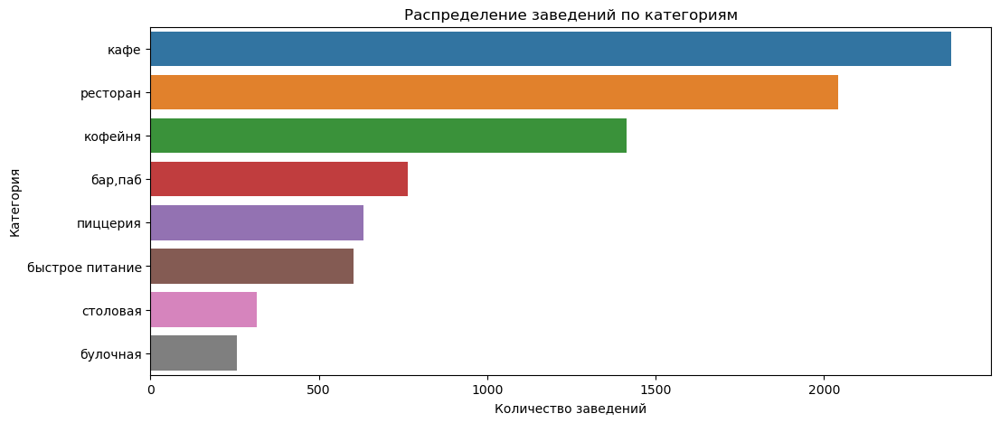

In [17]:
ax = sns.barplot(y='category', x='count', data=data_cat)
plt.title('Распределение заведений по категориям')
plt.xlabel('Количество заведений')
plt.ylabel('Категория')
plt.show()


### Распределение посадочных мест по категориям
<a id="analysis_seats"></a> 

Проверим распределение посадочных мест по категориям на предмет выбросов.

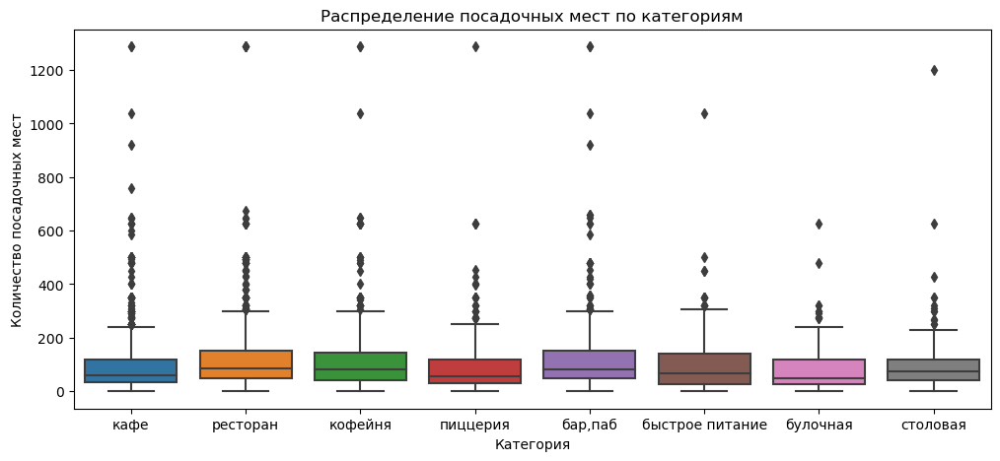

In [18]:
ax = sns.boxplot(x='category', y='seats', data=data)
plt.title('Распределение посадочных мест по категориям')
plt.xlabel('Категория')
plt.ylabel('Количество посадочных мест')
plt.show()

**Наблюдение:** в данных имеются выбросы, поэтому для анализа возьмем медианное значение по категориям.

In [19]:
data_seats = (
    data.groupby('category', as_index=False)['seats'].median()
    .sort_values(by='seats', ascending=False)
)
data_seats

,category,seats
6,ресторан,86.0
0,"бар,паб",82.5
4,кофейня,80.0
7,столовая,75.5
2,быстрое питание,65.0
3,кафе,60.0
5,пиццерия,55.0
1,булочная,50.0


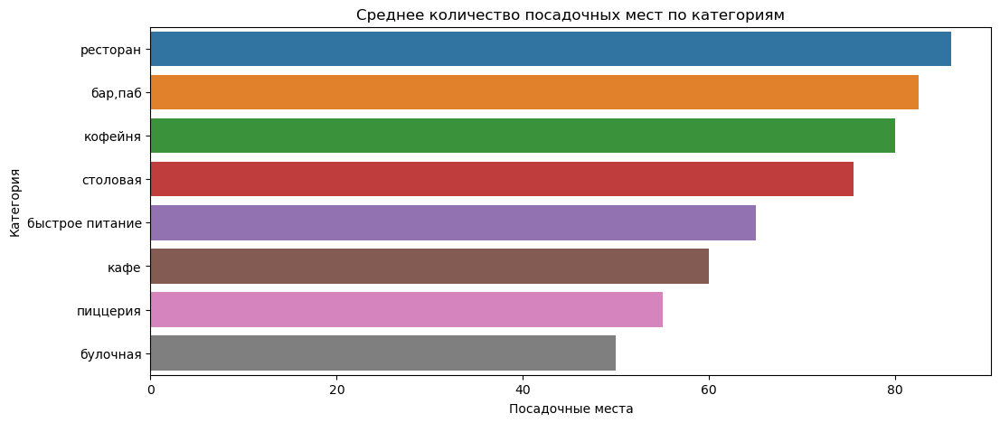

In [20]:
ax = sns.barplot(y='category', x='seats', data=data_seats)
plt.title('Среднее количество посадочных мест по категориям')
plt.xlabel('Посадочные места')
plt.ylabel('Категория')
plt.show()

**Наблюдение:** во всех категориях наблюдаются точечные выбросы в диапазоне от 600 до 1300, это могут быть ошибки в данных.\
В среднем в ресторанах, барах и кофейнях больше всего посадочных мест (80-86), меньше всего - в булочных(50).

### Соотношение сетевых и несетевых заведений
<a id="analysis_chain"></a> 

Рассмотрим и изобразим соотношение сетевых и несетевых заведений в датасете.

In [21]:
# столбец с информацией о сетях заменяем на более читаемый
data['chain'] = data['chain'].apply(lambda x: 'сеть' if x == 1 else 'не сеть')

In [22]:
chain = data.groupby('chain', as_index=False)['address'].nunique()
chain

,chain,address
0,не сеть,3962
1,сеть,2392


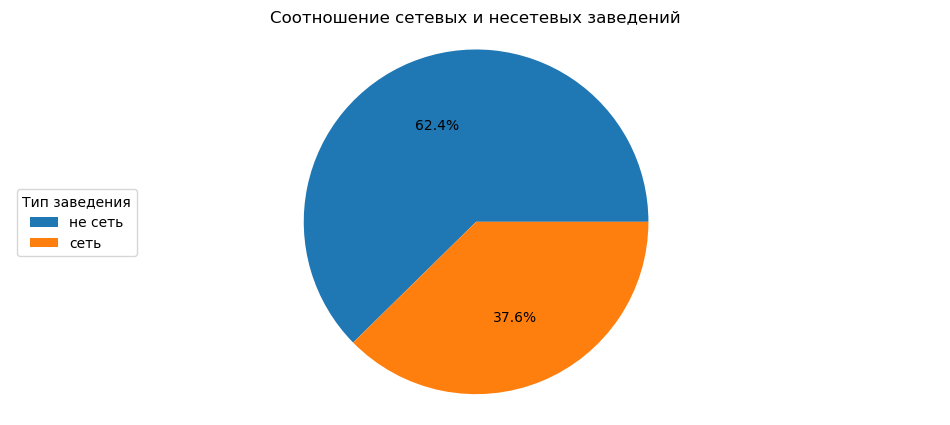

In [23]:
labels = chain['chain']
sizes = chain['address']

plt.pie(sizes, autopct='%1.1f%%')
plt.legend(labels,
          title="Тип заведения",
          loc="center left")
plt.axis('equal') 
plt.title('Соотношение сетевых и несетевых заведений')

plt.show()

**Наблюдение:** несетевых заведений примерно на 25% больше, чем сетевых.

Проверим, какие категории заведений чаще являются сетевыми.

In [24]:
chain_share_data = data.pivot_table(index='category', columns='chain', values='name', aggfunc='count')
chain_share_data.columns = ['not_chain', 'chain']
chain_share_data['total'] = chain_share_data['not_chain'] + chain_share_data['chain']
chain_share_data['share'] = (chain_share_data['chain']/chain_share_data['total']*100).round().astype('int')
chain_share_data = chain_share_data.sort_values(by='share', ascending=False)
chain_share_data 

,not_chain,chain,total,share
category,,,,
булочная,99,157,256,61
пиццерия,303,330,633,52
кофейня,693,720,1413,51
быстрое питание,371,232,603,38
ресторан,1313,730,2043,36
кафе,1599,779,2378,33
столовая,227,88,315,28
"бар,паб",596,169,765,22


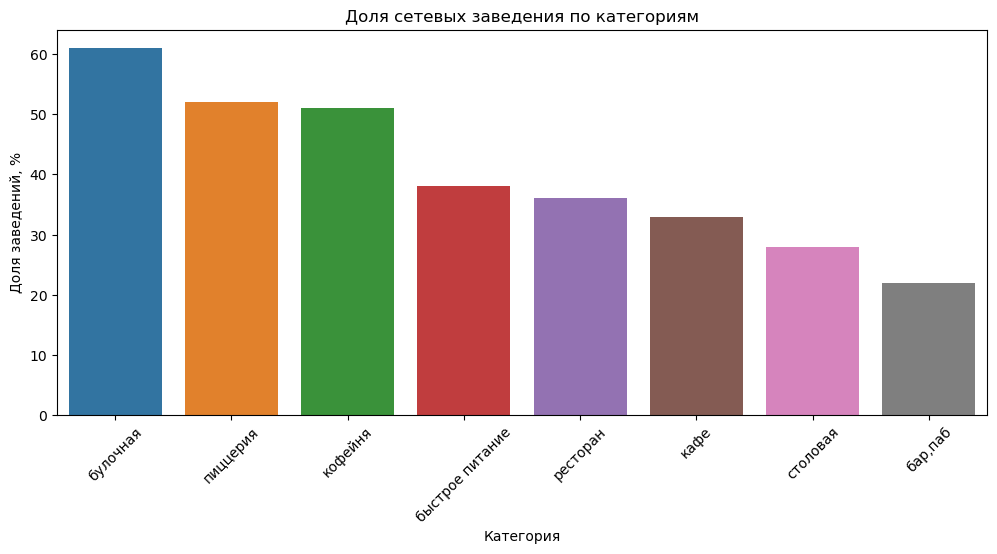

In [25]:
ax = sns.barplot(x=chain_share_data.index, y='share', data=chain_share_data)
plt.xticks(rotation=45)
plt.title('Доля сетевых заведения по категориям')
plt.xlabel('Категория')
plt.ylabel('Доля заведений, %')
plt.show()

**Наблюдение:** среди сетевых заведений первое место занимает категория "булочная" (61%), на втором месте пиццерии (52%). На последнем - бары, пабы (22%).

Найдем топ-15 популярных сетей в Москве.

In [26]:
top15_chains = (
    data.query('chain == "сеть"')
    .groupby('name')['address'].nunique()
    .reset_index()
    .sort_values(by='address', ascending=False)
    .rename(columns={'address':'count'})
    .head(15)
)
top15_chains

,name,count
729,шоколадница,119
335,домино'с пицца,76
331,додо пицца,74
742,яндекс лавка,72
146,one price coffee,71
58,cofix,65
168,prime,50
664,хинкальная,44
409,кофепорт,42
418,кулинарная лавка братьев караваевых,39


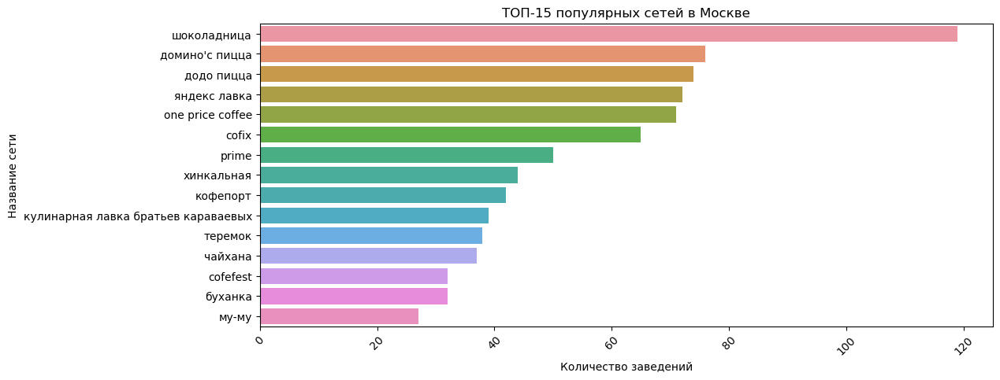

In [27]:
ax = sns.barplot(y='name', x='count', data=top15_chains)
plt.xticks(rotation=45)
plt.title('ТОП-15 популярных сетей в Москве')
plt.ylabel('Название сети')
plt.xlabel('Количество заведений')
plt.show()

Посмотрим, есть ли какой-то признак, который объединяет популярные сети.

In [28]:
data[data['name'].isin(top15_chains['name'])].groupby('category', as_index=False)['category'].size().sort_values(by='size', ascending=False)

,category,size
4,кофейня,337
6,ресторан,189
5,пиццерия,153
3,кафе,100
1,булочная,25
2,быстрое питание,12
0,"бар,паб",4
7,столовая,2


In [29]:
round((336/top15_chains['count'].sum()*100), 2)

41.08

**Наблюдение:** популярные сети представлены во всех 8 категориях, большая часть относится к кофейням - 41%.

In [30]:
data[data['name'].isin(top15_chains['name'])].groupby('name', as_index=False)['rating'].median().sort_values(by='rating', ascending=False)

,name,rating
4,буханка,4.40
8,кулинарная лавка братьев караваевых,4.40
11,хинкальная,4.40
5,додо пицца,4.30
9,му-му,4.30
2,one price coffee,4.20
3,prime,4.20
6,домино'с пицца,4.20
7,кофепорт,4.20
13,шоколадница,4.20


**Наблюдение:** средний рейтинг популярных сетей лежит в диапазоне от 4 до 4.4.

In [31]:
data[data['name'].isin(top15_chains['name'])].groupby('district', as_index=False)['district'].size().sort_values(by='size', ascending=False)

,district,size
5,Центральный административный округ,216
1,Западный административный округ,89
8,Южный административный округ,89
2,Северный административный округ,88
3,Северо-Восточный административный округ,86
0,Восточный административный округ,81
7,Юго-Западный административный округ,70
6,Юго-Восточный административный округ,56
4,Северо-Западный административный округ,47


In [32]:
round((214/top15_chains['count'].sum()*100), 2)

26.16

**Наблюдение:** популярные сети представлены во всех 9 районах Москвы. Большая часть приходится на ЦАО - 26%.

In [33]:
data[data['name'].isin(top15_chains['name'])].groupby('price', as_index=False)['price'].size().sort_values(by='size', ascending=False)

,price,size
3,средние,211
2,низкие,23
1,выше среднего,6
0,высокие,2


In [34]:
round((210/top15_chains['count'].sum()*100), 2)

25.67

**Наблюдение:** популярные сети представлены во всех 4 категориях цен, превалирует средняя ценовая категория - таких заведений 26%.

In [35]:
data[data['name'].isin(top15_chains['name'])].groupby('is_24/7', as_index=False)['is_24/7'].size().sort_values(by='size', ascending=False)

,is_24/7,size
0,False,780
1,True,42


In [36]:
round((774/top15_chains['count'].sum()*100), 2)

94.62

**Наблюдение:** около 95% популярных сетевых заведений работают не круглосуточно.

### Распределение заведений по районам
<a id="analysis_district"></a> 

Исследуем общее количество заведений и количество заведений каждой категории по районам.

In [37]:
district_data = (
    data.groupby('district')['name'].count()
    .reset_index()
    .sort_values(by='name', ascending=False)
    .rename(columns={'name':'count'})
)

district_data

,district,count
5,Центральный административный округ,2242
2,Северный административный округ,900
8,Южный административный округ,892
3,Северо-Восточный административный округ,891
1,Западный административный округ,851
0,Восточный административный округ,798
6,Юго-Восточный административный округ,714
7,Юго-Западный административный округ,709
4,Северо-Западный административный округ,409


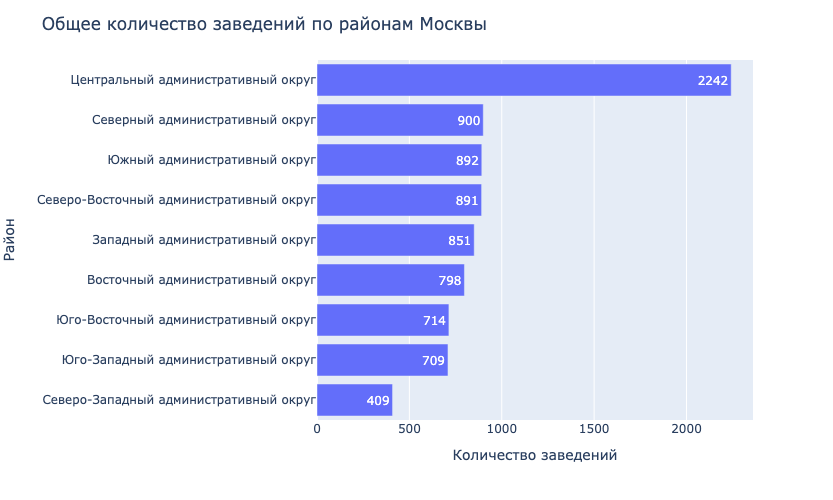

'district.html'

In [38]:
fig = px.bar(district_data.sort_values(by='count'),
             x='count', 
             y='district',
             text='count'
            )
fig.update_layout(width=800,
                  height=500,
                  title='Общее количество заведений по районам Москвы',
                  xaxis_title='Количество заведений',
                  yaxis_title='Район')
fig.show()
pyo.plot(fig, filename='district.html')

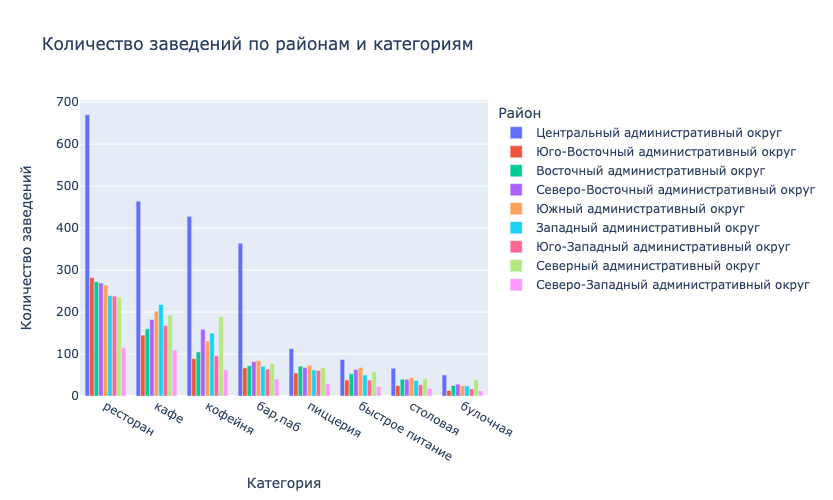

'district2.html'

In [73]:
data_grouped = (
    data.groupby(['district', 'category']).size()
    .reset_index(name='count')
    .sort_values(by='count', ascending=False)
)

# создаем список уникальных районов и категорий
districts = data_grouped['district'].unique().tolist()
categories = data_grouped['category'].unique().tolist()

# создаем список словарей, каждый словарь соответствует столбику внутри столбца района
data_list = []
for district in districts:
    district_data = data_grouped[data_grouped['district'] == district]
    data_dict = {}
    data_dict['x'] = categories
    data_dict['y'] = district_data['count'].tolist()
    data_dict['name'] = district
    data_list.append(data_dict)

# создаем график
fig = go.Figure()
for data_dict in data_list:
    fig.add_trace(go.Bar(x=data_dict['x'], y=data_dict['y'], name=data_dict['name']))

# настраиваем параметры графика
fig.update_layout(
    width=1000,
    height=500,
    title='Количество заведений по районам и категориям',
    xaxis_title='Категория',
    yaxis_title='Количество заведений',
    barmode='group',
    legend=dict(title='Район'),
)
fig.show()
pyo.plot(fig, filename='district2.html')

**Наблюдение:** ЦАО является безусловным лидером по общему количеству заведений и по количеству заведений в каждой категории. На последнем месте Северо-Западный административный округ.

### Распределение средних рейтингов по категориям заведений
<a id="analysis_rating"></a> 

Построим диаграммы размаха для среднего рейтинга заведений по категориям.

In [40]:
data.groupby('category')['rating'].median()

category
бар,паб            4.4
булочная           4.3
быстрое питание    4.2
кафе               4.2
кофейня            4.3
пиццерия           4.3
ресторан           4.3
столовая           4.3
Name: rating, dtype: float64

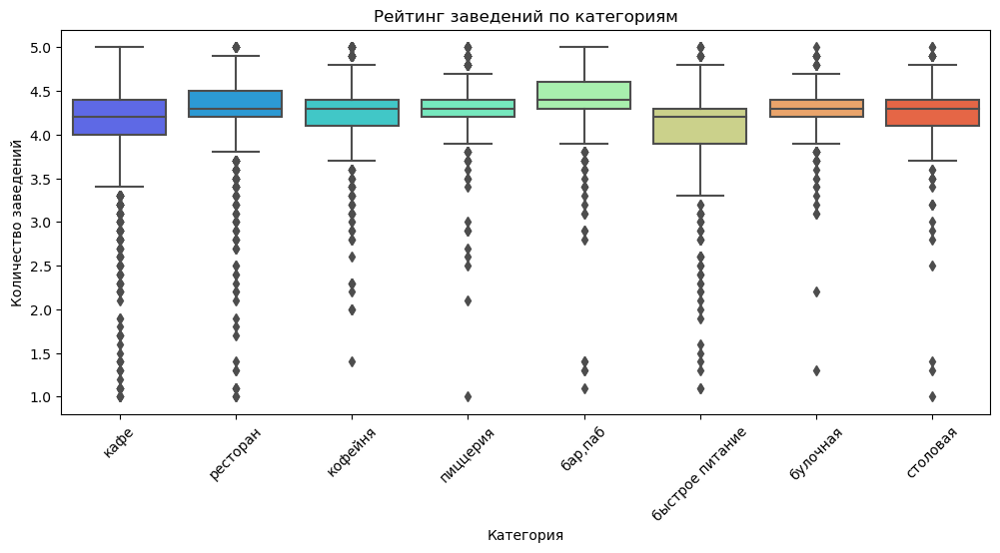

In [41]:
ax = sns.boxplot(x='category', y='rating', data=data, palette='rainbow')
plt.xticks(rotation=45)
plt.title('Рейтинг заведений по категориям')
plt.xlabel('Категория')
plt.ylabel('Количество заведений')
plt.show()

**Наблюдение:** усредненные рейтинги заведений по категориям мало отличаются и лежат в диапазоне 4.2-4.4.

Построим фоновую картограмму со средним рейтингом заведений каждого района.

In [42]:
rating_data = data.groupby('district', as_index=False)['rating'].agg('median').sort_values(by='rating', ascending=False)
rating_data

,district,rating
5,Центральный административный округ,4.4
0,Восточный административный округ,4.3
1,Западный административный округ,4.3
2,Северный административный округ,4.3
4,Северо-Западный административный округ,4.3
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3
3,Северо-Восточный административный округ,4.2
6,Юго-Восточный административный округ,4.2


In [43]:
# загружаем JSON-файл с границами округов Москвы
import os
pth1 = '/datasets/admin_level_geomap.geojson'
pth2 = '/Users/porphyrion/Desktop/PRACTICUM/my_projects/datasets/admin_level_geomap.geojson'
if os.path.exists(pth1):
    state_geo = pth1
elif os.path.exists(pth2):
    state_geo = pth2
else:
    print("Проверьте правильность пути к файлу")

In [75]:
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=rating_data,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

data.apply(create_clusters, axis=1)

m

**Наблюдение:** в ЦАО наблюдается самый высокий средний рейтинг - 4.4. Самые низкие показатели в СВАО и ЮВАО - 4.2. 

### Распределение заведений по улицам
<a id="analysis_street"></a> 

Найдем топ-15 улиц по количеству заведений.

In [45]:
top15_streets = (
    data.groupby('street', as_index=False)['address'].nunique()
    .sort_values(by='address', ascending=False)
    .rename(columns={'address':'count'})
    .head(15)
)
top15_streets

,street,count
1090,проспект Мира,101
524,Ленинский проспект,66
522,Ленинградский проспект,62
775,Профсоюзная улица,52
372,Дмитровское шоссе,51
297,Варшавское шоссе,46
453,Каширское шоссе,40
1087,проспект Вернадского,39
549,МКАД,38
523,Ленинградское шоссе,35


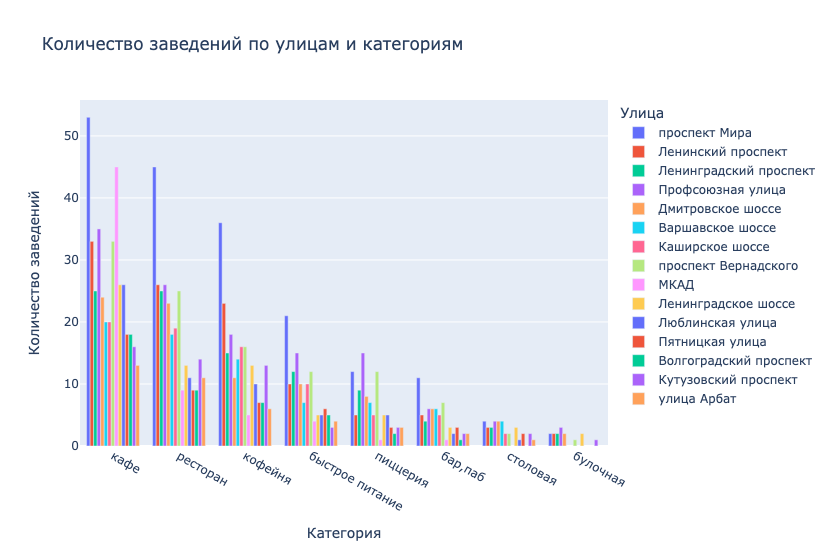

In [46]:
street_cat = (
    data.groupby(['street', 'category']).size()
    .reset_index(name='count')
    .sort_values(by='count', ascending=False)
)

# создаем список уникальных районов и категорий
streets = top15_streets['street'].tolist()
categories = street_cat['category'].unique().tolist()

data_list = []
for s in streets:
    street_data = street_cat[street_cat['street'] == s]
    data_dict = {}
    data_dict['x'] = categories
    data_dict['y'] = street_data['count'].tolist()
    data_dict['name'] = s
    data_list.append(data_dict)

fig = go.Figure()
for data_dict in data_list:
    fig.add_trace(go.Bar(x=data_dict['x'], y=data_dict['y'], name=data_dict['name']))

fig.update_layout(
    width=1000,
    height=550,
    title='Количество заведений по улицам и категориям',
    xaxis_title='Категория',
    yaxis_title='Количество заведений',
    barmode='group',
    legend=dict(title='Улица'),
)
fig.show()

**Наблюдение:** проспект Мира является безусловным лидером по общему количеству заведений, а также по количеству заведений в категориях кафе, ресторан, кофейня, быстрое питание, пиццерия.

Найдем улицы, на которых находится только один объект общепита и проанализируем эти объекты.

In [47]:
one_object_street = (
    data.groupby('street', as_index=False)['name'].nunique()
    .rename(columns={'name':'count'})
)
one_object_street = one_object_street[one_object_street['count'] == 1]
one_object_street = one_object_street['street'].tolist()
len(one_object_street)

471

In [48]:
one_object_data = data[data['street'].isin(one_object_street)]
one_object_data.groupby('category', as_index=False)['street'].nunique().sort_values(by='street', ascending=False)

,category,street
3,кафе,166
6,ресторан,94
4,кофейня,87
0,"бар,паб",40
7,столовая,37
2,быстрое питание,24
5,пиццерия,15
1,булочная,8


In [49]:
one_object_data.groupby('district', as_index=False)['name'].count().sort_values(by='name', ascending=False)

,district,name
5,Центральный административный округ,147
0,Восточный административный округ,57
3,Северо-Восточный административный округ,57
2,Северный административный округ,54
8,Южный административный округ,43
6,Юго-Восточный административный округ,41
1,Западный административный округ,37
4,Северо-Западный административный округ,20
7,Юго-Западный административный округ,18


In [50]:
one_object_data.groupby('chain', as_index=False)['name'].count().sort_values(by='name', ascending=False)

,chain,name
0,не сеть,337
1,сеть,137


In [51]:
one_object_data.groupby('price', as_index=False)['name'].count().sort_values(by='name', ascending=False)

,price,name
3,средние,121
1,выше среднего,29
0,высокие,22
2,низкие,10


In [52]:
one_object_data.groupby('is_24/7', as_index=False)['name'].count().sort_values(by='name', ascending=False)

,is_24/7,name
0,False,443
1,True,31


In [53]:
one_object_data['rating'].median()

4.3

**Наблюдение:** обнаружено 460 улиц, на которых находится по одному заведению общепита. В основном это несетевые, некруглосуточные кафе в ЦАО со средними ценами и рейтингом 4.3.

### Средний чек заведений по районам
<a id="analysis_bill"></a> 

Найдем медианное значение среднего чека по районам, построим картограмму и проанализируем результат.

In [54]:
avg_bill_data = (
    data.groupby('district', as_index=False)['middle_avg_bill'].median()
    .sort_values(by='middle_avg_bill', ascending=False)
)
avg_bill_data

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [55]:
m2 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=avg_bill_data,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity=0.8,
    legend_name='Средний чек заведений по районам',
).add_to(m2)

m2

**Наблюдение:** средний чек в ЗАО не уступает центру и равен 1000 руб. В остальных районах чек ниже. Самый низкий показатель в ЮВАО - 450 руб.

### Заведения с низкими рейтингами
<a id="analysis_low_rating"></a> 

In [56]:
low_rating = data[data['rating']<3.5]

In [57]:
low_rating.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 434 entries, 47 to 8395
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               434 non-null    object 
 1   category           434 non-null    object 
 2   address            434 non-null    object 
 3   district           434 non-null    object 
 4   hours              360 non-null    object 
 5   lat                434 non-null    float64
 6   lng                434 non-null    float64
 7   rating             434 non-null    float64
 8   price              51 non-null     object 
 9   avg_bill           78 non-null     object 
 10  middle_avg_bill    70 non-null     float64
 11  middle_coffee_cup  8 non-null      float64
 12  chain              434 non-null    object 
 13  seats              210 non-null    float64
 14  street             434 non-null    object 
 15  is_24/7            434 non-null    bool   
dtypes: bool(1), float64(6), 

In [58]:
low_rating['middle_avg_bill'].median()

460.0

In [59]:
low_rating_cat = low_rating.groupby('category', as_index=False)['name'].count().sort_values(by='name', ascending=False).rename(columns={'name':'count'})
low_rating_cat

,category,count
3,кафе,214
6,ресторан,66
2,быстрое питание,65
4,кофейня,45
0,"бар,паб",15
7,столовая,11
5,пиццерия,10
1,булочная,8


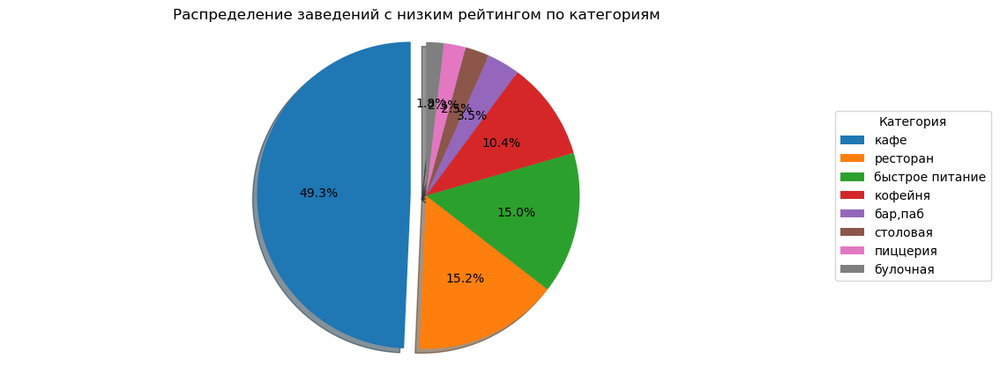

In [60]:
labels = low_rating_cat['category']
sizes = low_rating_cat['count']
explode = (0.1, 0, 0, 0, 0, 0, 0,0)

plt.pie(sizes, explode=explode, autopct='%1.1f%%',
        shadow=True, startangle=90)
plt.legend(labels,
          title="Категория",
          loc="center left",
          bbox_to_anchor=(1, 0, 0.5, 1))
plt.axis('equal') 
plt.title('Распределение заведений с низким рейтингом по категориям ')

plt.show()

In [61]:
low_rating_dist = low_rating.groupby('district', as_index=False)['name'].count().sort_values(by='name', ascending=False).rename(columns={'name':'count'})
low_rating_dist

,district,count
6,Юго-Восточный административный округ,76
3,Северо-Восточный административный округ,66
0,Восточный административный округ,62
8,Южный административный округ,59
1,Западный административный округ,53
7,Юго-Западный административный округ,40
2,Северный административный округ,37
4,Северо-Западный административный округ,21
5,Центральный административный округ,20


**Наблюдение:** найдено 434 заведения с рейтингом ниже 3.5. Около половины из них - кафе. Средний чек таких заведений - 460 руб. Заведения с низким рейтингом представлены во всех 9 районах, больше всего их в ЮВАО, меньше всего - в ЦАО.

### Вывод
<a id="analysis_conclusion"></a> 

В результате анализа данных о заведениях общественного питания Москвы обнаружены следующие наблюдения:
- больше всего в Москве ресторанов и кафе - 24.3%, 28.3% соответственно, меньше всего столовых и булочных (около 7%);
- в среднем в ресторанах, барах и кофейнях больше всего посадочных мест (80-86), меньше всего - в булочных(50);
- несетевых заведений примерно на 25% больше, чем сетевых;
- среди сетевых заведений первое место занимает категория "булочная" (61%), на втором месте пиццерии (52%). На последнем - бары, пабы (22%);
- ЦАО является безусловным лидером по общему количеству заведений и по количеству заведений в каждой категории. На последнем месте СЗАО;
- усредненные рейтинги заведений по категориям мало отличаются и лежат в диапазоне 4.2-4.4;
- проспект Мира является безусловным лидером по общему количеству заведений, а также по количеству заведений в категориях кафе, ресторан, кофейня, быстрое питание, пиццерия;
- средний чек в ЗАО не уступает центру и равен 1000 руб. В остальных районах чек ниже. Самый низкий показатель в ЮВАО - 450 руб;
- среди заведения с рейтингом ниже 3.5 около половины - кафе. Средний чек - 460 руб. Больше всего их в ЮВАО, меньше всего - в ЦАО.

## Детальное исследование: открытие кофейни
<a id="research"></a> 

В этой части исследования мы ответим на вопросы:
- Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?
- Есть ли круглосуточные кофейни?
- Какие у кофеен рейтинги? Как они распределяются по районам?
- На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

А также дадим рекомендации для открытия нового заведения.

In [62]:
coffeeshop = data[data['category']=='кофейня']
len(coffeeshop) #количество кофеен в датасете

1413

In [63]:
coffeeshop_dist = coffeeshop.groupby('district')['name'].count().reset_index()\
.sort_values(by='name', ascending=False).rename(columns={'name':'count'})

coffeeshop_dist

,district,count
5,Центральный административный округ,428
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
1,Западный административный округ,150
8,Южный административный округ,131
0,Восточный административный округ,105
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


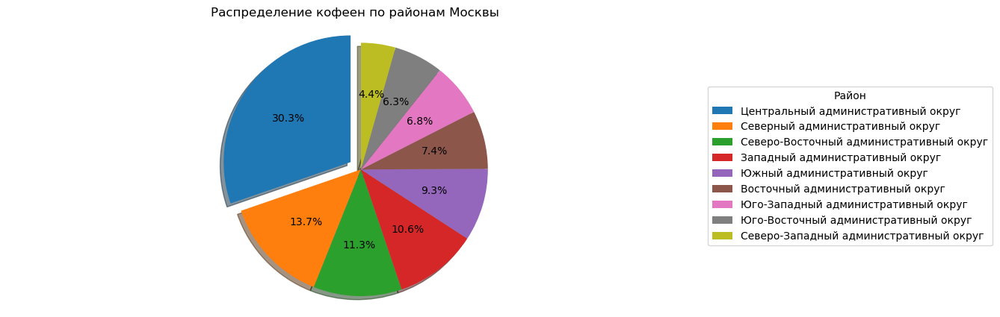

In [64]:
labels = coffeeshop_dist['district']
sizes = coffeeshop_dist['count']
explode = (0.1, 0, 0, 0, 0, 0, 0, 0, 0)

plt.pie(sizes, explode=explode, autopct='%1.1f%%',
        shadow=True, startangle=90)
plt.legend(labels,
          title="Район",
          loc="center left",
          bbox_to_anchor=(1, 0, 0.5, 1))
plt.axis('equal') 
plt.title('Распределение кофеен по районам Москвы')

plt.show()

In [65]:
coffeeshop[coffeeshop['is_24/7']==True]['name'].count() #круглосуточные кофейни

59

In [66]:
coffeeshop_dist_24 = coffeeshop.groupby(['district', 'is_24/7'],as_index = False)[['name']].count()
    
coffeeshop_dist_24
#круглосуточные кофейни по районам

,district,is_24/7,name
0,Восточный административный округ,False,100
1,Восточный административный округ,True,5
2,Западный административный округ,False,141
3,Западный административный округ,True,9
4,Северный административный округ,False,188
5,Северный административный округ,True,5
6,Северо-Восточный административный округ,False,156
7,Северо-Восточный административный округ,True,3
8,Северо-Западный административный округ,False,60
9,Северо-Западный административный округ,True,2


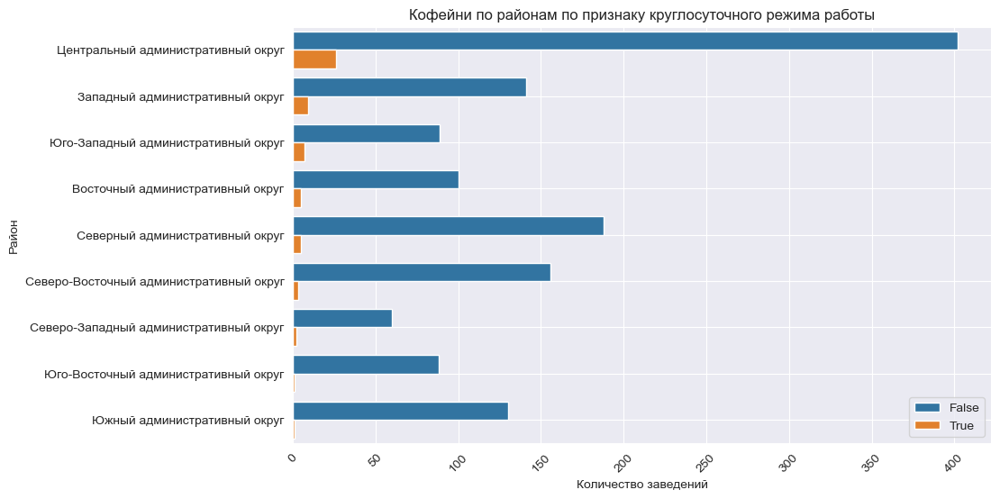

In [67]:
sns.set_style('dark')
plt.figure(figsize=(10, 6))
sns.barplot(x='name', y='district', data=coffeeshop_dist_24.sort_values(by=['is_24/7','name'], ascending=False), hue='is_24/7')
plt.title('Кофейни по районам по признаку круглосуточного режима работы')
plt.xlabel('Количество заведений')
plt.ylabel('Район')
plt.xticks(rotation=45)
plt.legend(loc='lower right', fontsize=10)
plt.grid()
plt.show()

In [68]:
coffeeshop.groupby('is_24/7')['middle_coffee_cup'].median() 
#средняя цена чашки капучино в кофейнях в зависимости от режима работы

is_24/7
False    165.0
True     256.0
Name: middle_coffee_cup, dtype: float64

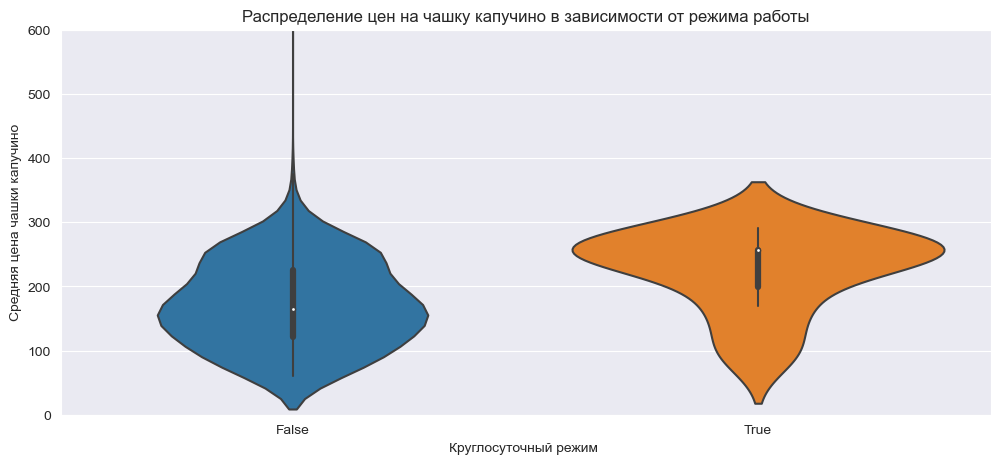

In [69]:
sns.set_style('darkgrid')
ax = sns.violinplot(y='middle_coffee_cup', x='is_24/7', data=coffeeshop)
plt.ylim(0, 600)
plt.title('Распределение цен на чашку капучино в зависимости от режима работы')
plt.xlabel('Круглосуточный режим ')
plt.ylabel('Средняя цена чашки капучино')
plt.show()

In [70]:
coffeeshop.groupby('district')['rating'].median() #средние рейтинги кофеен по районам

district
Восточный административный округ           4.3
Западный административный округ            4.2
Северный административный округ            4.3
Северо-Восточный административный округ    4.3
Северо-Западный административный округ     4.3
Центральный административный округ         4.3
Юго-Восточный административный округ       4.3
Юго-Западный административный округ        4.3
Южный административный округ               4.3
Name: rating, dtype: float64

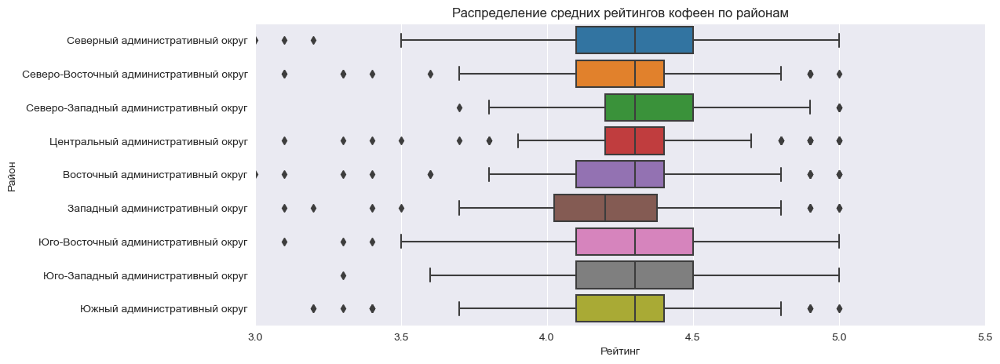

In [71]:
ax = sns.boxplot(x='rating',y='district', data=coffeeshop)
plt.xlim(3, 5.5)
plt.title('Распределение средних рейтингов кофеен по районам')
plt.xlabel('Рейтинг')
plt.ylabel('Район')
plt.show()

In [72]:
m3 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=coffeeshop_dist,
    columns=['district', 'count'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Распределение круглосуточных кофеен по районам',
).add_to(m3)

marker_cluster = MarkerCluster().add_to(m3)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']} {row['middle_coffee_cup']}",
    ).add_to(marker_cluster)

coffeeshop[coffeeshop['is_24/7']==True].apply(create_clusters, axis=1)

m3

**Наблюдение:** среди 1413 кофеен, представленных в датасете, 59 круглосуточных. Подавляющее большинство кофеен находится в ЦАО. Круглосуточные кофейни в ЦАО расположены близ станций метро и вокзалов. Средний рейтинг кофеен по городу - 4.3. Средняя цена чашки капучино - 170 рублей.

## Общий вывод, рекомендации
<a id="conclusion"></a> 

В результате анализа данных о заведениях общественного питания Москвы обнаружены следующие наблюдения:
- больше всего в Москве ресторанов и кафе - 24.3%, 28.3% соответственно, меньше всего столовых и булочных (около 7%);
- в среднем в ресторанах, барах и кофейнях больше всего посадочных мест (80-86), меньше всего - в булочных(50);
- несетевых заведений примерно на 25% больше, чем сетевых;
- среди сетевых заведений первое место занимает категория "булочная" (61%), на втором месте пиццерии (52%). На последнем - бары, пабы (22%);
- ЦАО является безусловным лидером по общему количеству заведений и по количеству заведений в каждой категории. На последнем месте СЗАО;
- усредненные рейтинги заведений по категориям мало отличаются и лежат в диапазоне 4.2-4.4;
- проспект Мира является безусловным лидером по общему количеству заведений, а также по количеству заведений в категориях кафе, ресторан, кофейня, быстрое питание, пиццерия;
- средний чек в ЗАО не уступает центру и равен 1000 руб. В остальных районах чек ниже. Самый низкий показатель в ЮВАО - 450 руб;
- среди заведения с рейтингом ниже 3.5 около половины - кафе. Средний чек - 460 руб. Больше всего их в ЮВАО, меньше всего - в ЦАО.

В результате детального исследования кофеен Москвы обнаружены следующие наблюдения:
- среди 1413 кофеен, представленных в датасете, 59 круглосуточных;
- треть кофеен находится в ЦАО;
- круглосуточные кофейни в ЦАО расположены близ станций метро и вокзалов;
- средний рейтинг кофеен по городу - 4.3; 
- средняя цена чашки капучино - 170 рублей;
- средняя цена чашки капучино в круглосуточных кофейнях - 256 рублей.

По итогам анализа можно дать следующие рекомендации для открытия кофейни:
- открытие круглосуточной кофейни в ЦАО со средним чеком 170 рублей даст преимущества перед другими круглосуточными кофейнями с более высоким чеком.

Презентация: <https://disk.yandex.ru/i/YuLX2aJHEOkISA>